In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, utils
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import os

In [14]:
latent_dim = 100
image_size = 28 * 28
batch_size = 64
learning_rate = 0.0002
num_epochs = 50

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [16]:
class Generator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 1024),
            nn.ReLU(),
            nn.Linear(1024, output_dim),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_dim):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

In [17]:
generator = Generator(input_dim=latent_dim, output_dim=image_size).to(device)
discriminator = Discriminator(input_dim=image_size).to(device)


optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate)

loss_function = nn.BCELoss()

In [18]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

In [19]:
train_dataset = datasets.MNIST(root='data', train=True, transform=transform, download=True)
dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)


Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9912422/9912422 [00:00<00:00, 15794634.61it/s]


Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28881/28881 [00:00<00:00, 478872.92it/s]


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1648877/1648877 [00:00<00:00, 4344474.90it/s]


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4542/4542 [00:00<00:00, 4397628.99it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



In [20]:
def generate_noise(batch_size, latent_dim):
    return torch.randn(batch_size, latent_dim).to(device)

In [21]:
def save_fake_images(epoch, images, save_dir='fake_images'):
    os.makedirs(save_dir, exist_ok=True)
    images = images.view(images.size(0), 1, 28, 28)
    images = (images + 1) / 2.0

    grid = utils.make_grid(images, nrow=8)
    filename = os.path.join(save_dir, f"epoch_{epoch}.png")
    utils.save_image(grid, filename)
    print(f"Saved fake images at epoch {epoch} to {filename}")

    plt.figure(figsize=(8, 8))
    plt.imshow(grid.permute(1, 2, 0).cpu().detach().numpy())  # Convert to numpy
    plt.title(f"Generated Images at Epoch {epoch}")
    plt.axis('off')
    plt.show()

Epoch [0/50], Step [0/938], D Loss: 1.3898, G Loss: 0.6964
Epoch [0/50], Step [200/938], D Loss: 0.0587, G Loss: 4.5643
Epoch [0/50], Step [400/938], D Loss: 0.1075, G Loss: 8.2422
Epoch [0/50], Step [600/938], D Loss: 1.1920, G Loss: 3.3589
Epoch [0/50], Step [800/938], D Loss: 0.4933, G Loss: 6.9351
Saved fake images at epoch 0 to fake_images/epoch_0.png


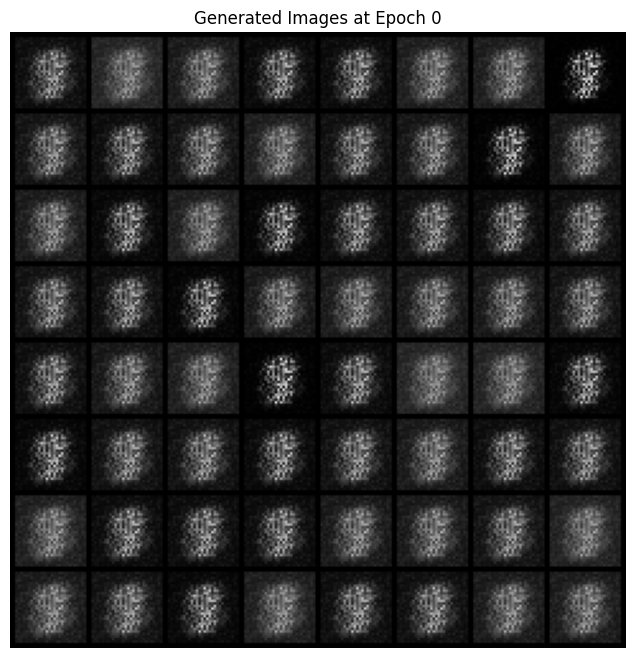

Epoch [1/50], Step [0/938], D Loss: 0.3959, G Loss: 2.5350
Epoch [1/50], Step [200/938], D Loss: 0.9759, G Loss: 0.8481
Epoch [1/50], Step [400/938], D Loss: 1.0723, G Loss: 0.9018
Epoch [1/50], Step [600/938], D Loss: 0.5378, G Loss: 2.4856
Epoch [1/50], Step [800/938], D Loss: 0.4530, G Loss: 3.4329
Saved fake images at epoch 1 to fake_images/epoch_1.png


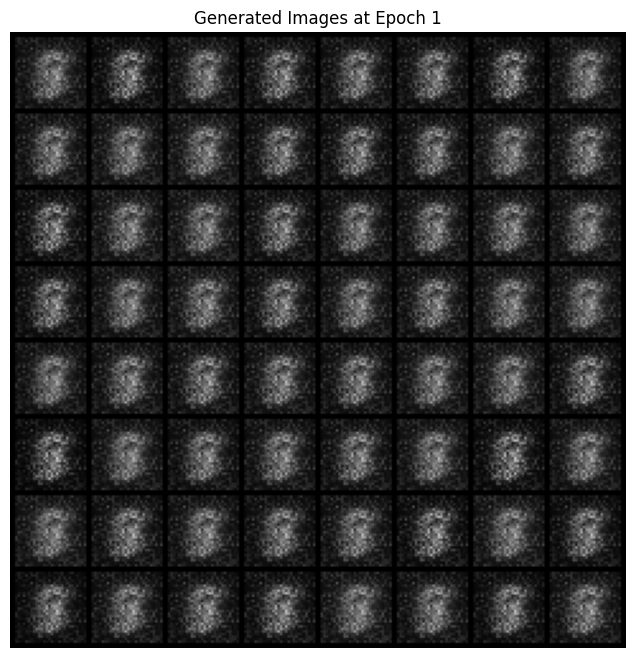

Epoch [2/50], Step [0/938], D Loss: 1.1163, G Loss: 3.8330
Epoch [2/50], Step [200/938], D Loss: 0.3193, G Loss: 3.8109
Epoch [2/50], Step [400/938], D Loss: 0.2937, G Loss: 3.3384
Epoch [2/50], Step [600/938], D Loss: 0.8410, G Loss: 2.4318
Epoch [2/50], Step [800/938], D Loss: 1.3383, G Loss: 2.0198
Saved fake images at epoch 2 to fake_images/epoch_2.png


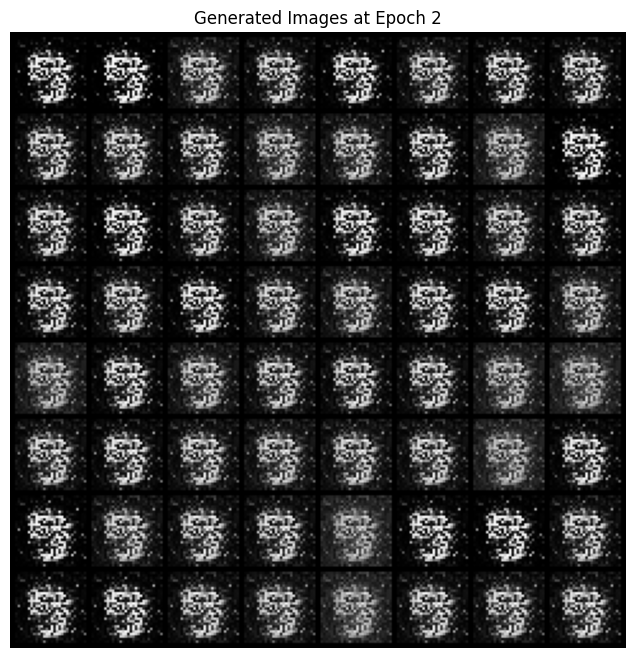

Epoch [3/50], Step [0/938], D Loss: 0.0500, G Loss: 5.2430
Epoch [3/50], Step [200/938], D Loss: 0.5489, G Loss: 6.6337
Epoch [3/50], Step [400/938], D Loss: 0.2413, G Loss: 6.6639
Epoch [3/50], Step [600/938], D Loss: 0.1086, G Loss: 4.0194
Epoch [3/50], Step [800/938], D Loss: 0.3416, G Loss: 3.8745
Saved fake images at epoch 3 to fake_images/epoch_3.png


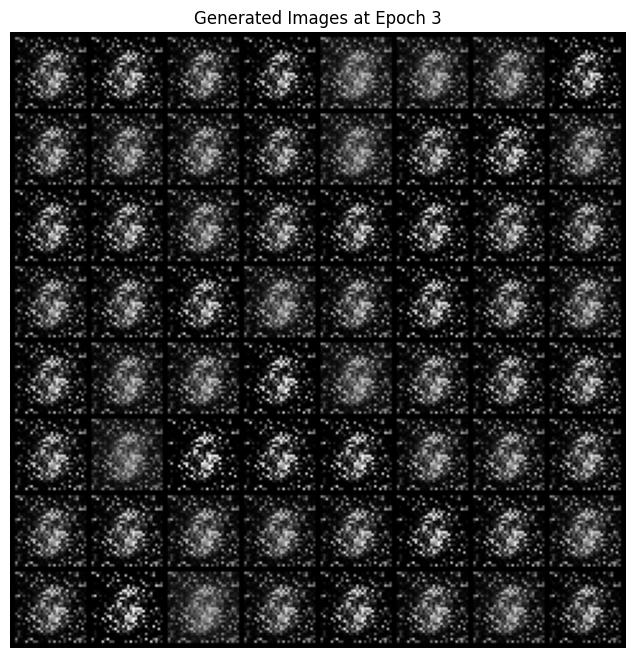

Epoch [4/50], Step [0/938], D Loss: 0.2357, G Loss: 5.7970
Epoch [4/50], Step [200/938], D Loss: 0.0584, G Loss: 3.9189
Epoch [4/50], Step [400/938], D Loss: 0.3648, G Loss: 3.4875
Epoch [4/50], Step [600/938], D Loss: 0.1980, G Loss: 4.9565
Epoch [4/50], Step [800/938], D Loss: 0.4620, G Loss: 4.9348
Saved fake images at epoch 4 to fake_images/epoch_4.png


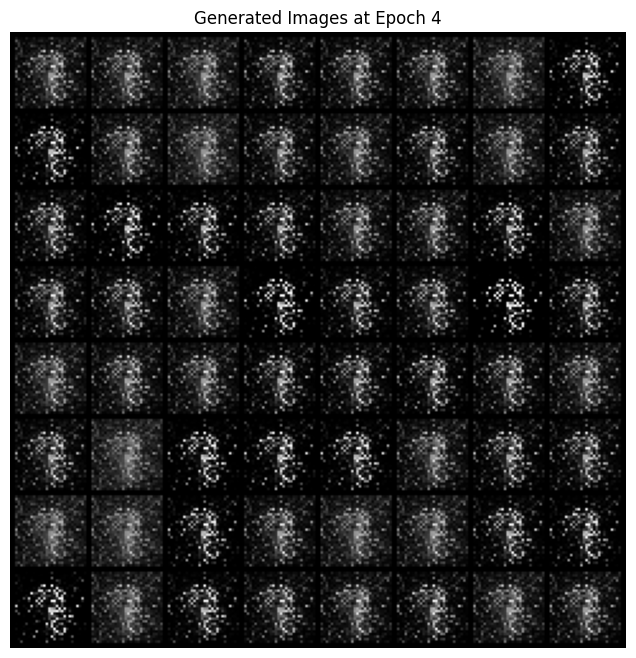

Epoch [5/50], Step [0/938], D Loss: 0.3896, G Loss: 4.2970
Epoch [5/50], Step [200/938], D Loss: 0.3541, G Loss: 2.5729
Epoch [5/50], Step [400/938], D Loss: 0.5392, G Loss: 2.4316
Epoch [5/50], Step [600/938], D Loss: 0.2295, G Loss: 4.0256
Epoch [5/50], Step [800/938], D Loss: 0.1112, G Loss: 6.2771
Saved fake images at epoch 5 to fake_images/epoch_5.png


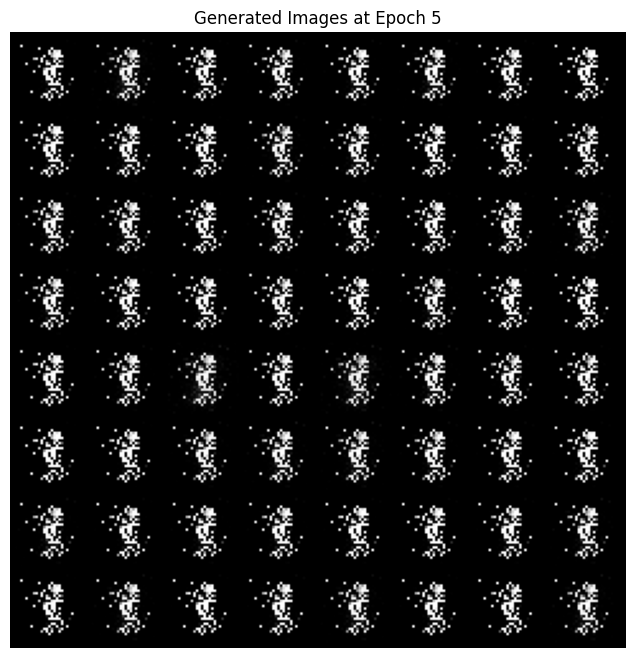

Epoch [6/50], Step [0/938], D Loss: 0.1689, G Loss: 5.7748
Epoch [6/50], Step [200/938], D Loss: 0.2138, G Loss: 3.7348
Epoch [6/50], Step [400/938], D Loss: 0.4264, G Loss: 3.0564
Epoch [6/50], Step [600/938], D Loss: 0.4478, G Loss: 6.1519
Epoch [6/50], Step [800/938], D Loss: 0.2225, G Loss: 3.7122
Saved fake images at epoch 6 to fake_images/epoch_6.png


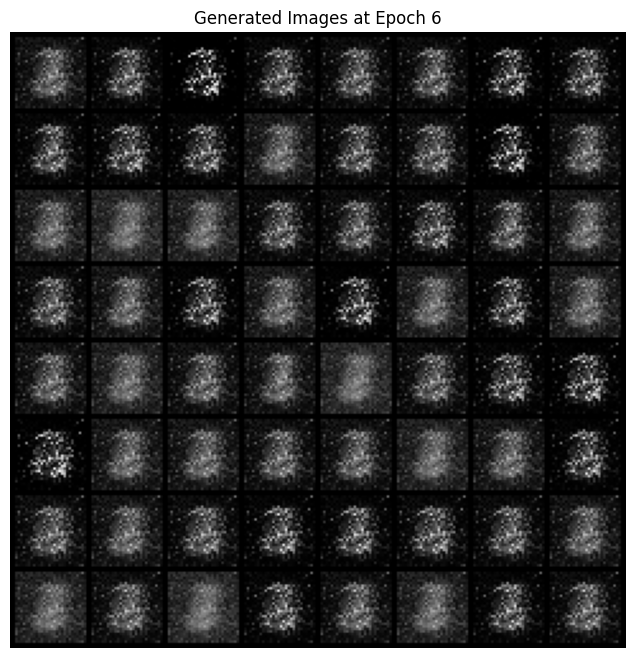

Epoch [7/50], Step [0/938], D Loss: 1.2527, G Loss: 4.1315
Epoch [7/50], Step [200/938], D Loss: 0.3966, G Loss: 4.6633
Epoch [7/50], Step [400/938], D Loss: 0.2519, G Loss: 4.3832
Epoch [7/50], Step [600/938], D Loss: 0.3206, G Loss: 4.2109
Epoch [7/50], Step [800/938], D Loss: 0.0829, G Loss: 5.1344
Saved fake images at epoch 7 to fake_images/epoch_7.png


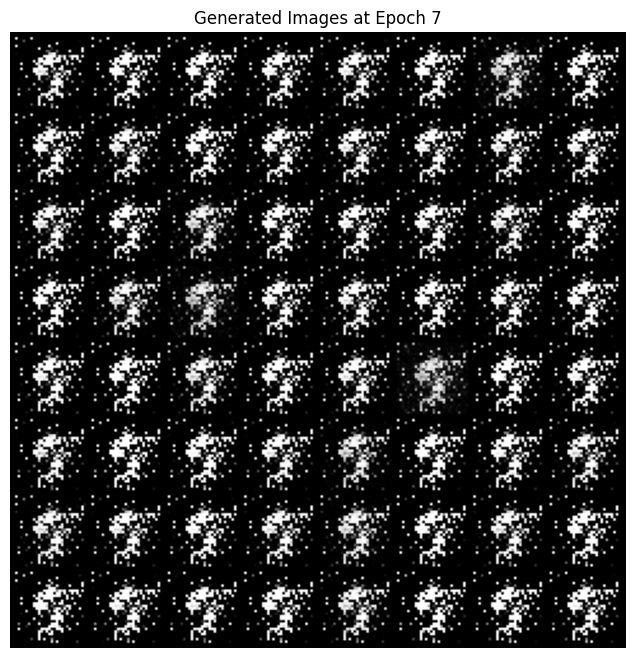

Epoch [8/50], Step [0/938], D Loss: 0.0094, G Loss: 10.5614
Epoch [8/50], Step [200/938], D Loss: 0.2578, G Loss: 7.8593
Epoch [8/50], Step [400/938], D Loss: 1.4271, G Loss: 14.9760
Epoch [8/50], Step [600/938], D Loss: 0.4538, G Loss: 3.9558
Epoch [8/50], Step [800/938], D Loss: 0.6794, G Loss: 3.4989
Saved fake images at epoch 8 to fake_images/epoch_8.png


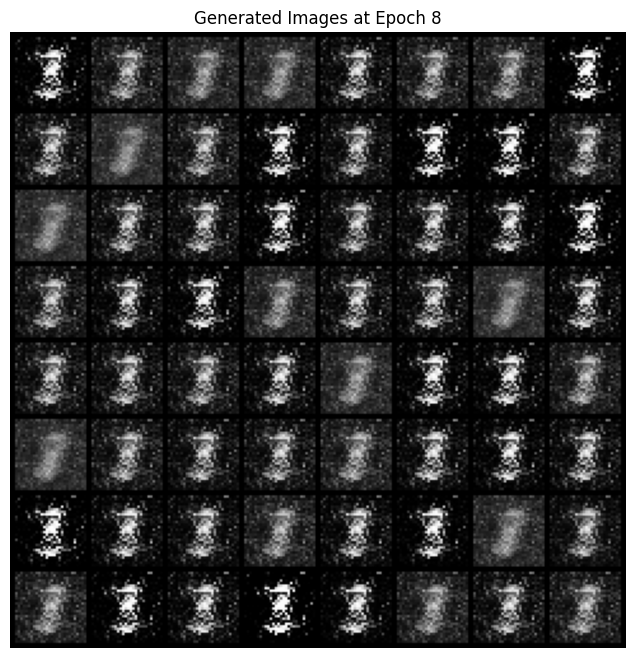

Epoch [9/50], Step [0/938], D Loss: 0.3868, G Loss: 3.2146
Epoch [9/50], Step [200/938], D Loss: 0.1461, G Loss: 5.3044
Epoch [9/50], Step [400/938], D Loss: 0.1937, G Loss: 6.8679
Epoch [9/50], Step [600/938], D Loss: 0.1450, G Loss: 5.6552
Epoch [9/50], Step [800/938], D Loss: 0.0276, G Loss: 7.0976
Saved fake images at epoch 9 to fake_images/epoch_9.png


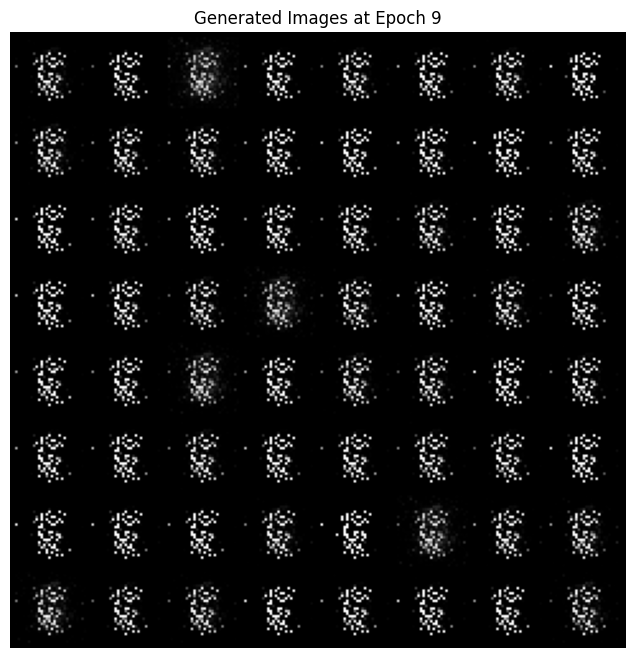

Epoch [10/50], Step [0/938], D Loss: 0.3371, G Loss: 6.9248
Epoch [10/50], Step [200/938], D Loss: 0.5263, G Loss: 6.4258
Epoch [10/50], Step [400/938], D Loss: 0.0693, G Loss: 4.6225
Epoch [10/50], Step [600/938], D Loss: 0.1592, G Loss: 6.8308
Epoch [10/50], Step [800/938], D Loss: 0.1115, G Loss: 6.1622
Saved fake images at epoch 10 to fake_images/epoch_10.png


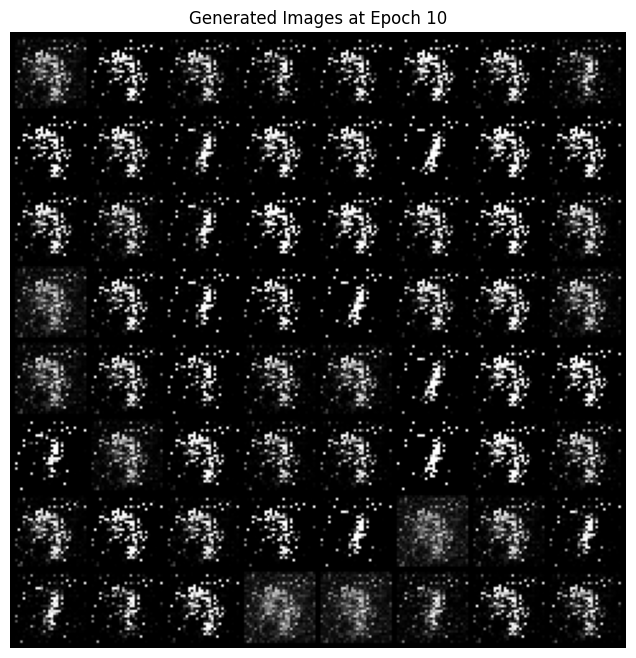

Epoch [11/50], Step [0/938], D Loss: 0.1915, G Loss: 4.8509
Epoch [11/50], Step [200/938], D Loss: 0.6227, G Loss: 4.4003
Epoch [11/50], Step [400/938], D Loss: 0.4882, G Loss: 1.9523
Epoch [11/50], Step [600/938], D Loss: 0.1571, G Loss: 6.2145
Epoch [11/50], Step [800/938], D Loss: 0.5367, G Loss: 4.2744
Saved fake images at epoch 11 to fake_images/epoch_11.png


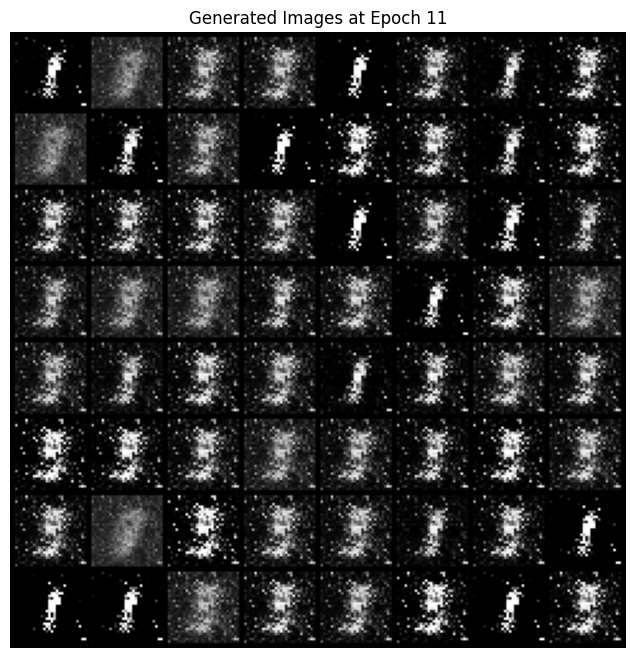

Epoch [12/50], Step [0/938], D Loss: 0.1470, G Loss: 4.5903
Epoch [12/50], Step [200/938], D Loss: 0.4292, G Loss: 4.5969
Epoch [12/50], Step [400/938], D Loss: 0.3549, G Loss: 4.3742
Epoch [12/50], Step [600/938], D Loss: 0.5016, G Loss: 4.8752
Epoch [12/50], Step [800/938], D Loss: 0.1782, G Loss: 6.3078
Saved fake images at epoch 12 to fake_images/epoch_12.png


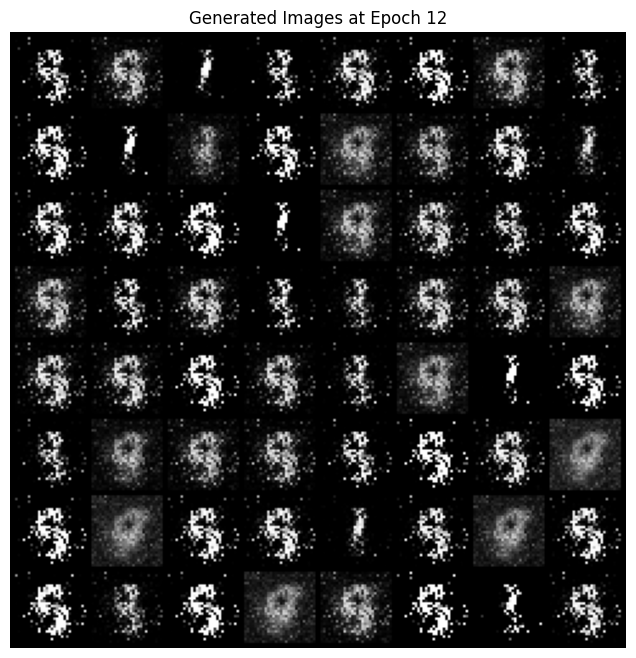

Epoch [13/50], Step [0/938], D Loss: 0.5875, G Loss: 6.9731
Epoch [13/50], Step [200/938], D Loss: 0.4428, G Loss: 5.3820
Epoch [13/50], Step [400/938], D Loss: 0.0791, G Loss: 7.1513
Epoch [13/50], Step [600/938], D Loss: 0.4075, G Loss: 6.4065
Epoch [13/50], Step [800/938], D Loss: 0.1962, G Loss: 4.7369
Saved fake images at epoch 13 to fake_images/epoch_13.png


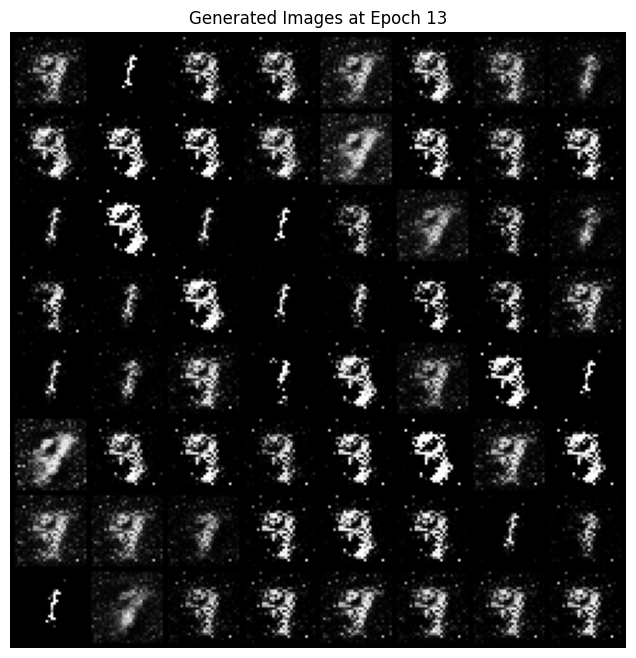

Epoch [14/50], Step [0/938], D Loss: 0.3595, G Loss: 3.9354
Epoch [14/50], Step [200/938], D Loss: 0.4791, G Loss: 7.3023
Epoch [14/50], Step [400/938], D Loss: 0.4160, G Loss: 2.5910
Epoch [14/50], Step [600/938], D Loss: 0.2480, G Loss: 5.6581
Epoch [14/50], Step [800/938], D Loss: 0.2084, G Loss: 4.6862
Saved fake images at epoch 14 to fake_images/epoch_14.png


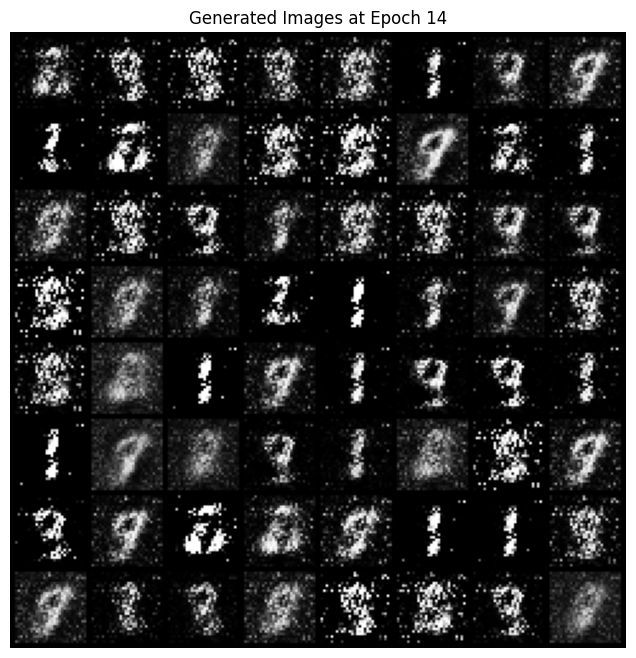

Epoch [15/50], Step [0/938], D Loss: 0.5070, G Loss: 4.5255
Epoch [15/50], Step [200/938], D Loss: 0.3753, G Loss: 3.9466
Epoch [15/50], Step [400/938], D Loss: 0.5429, G Loss: 4.4622
Epoch [15/50], Step [600/938], D Loss: 0.6278, G Loss: 3.6578
Epoch [15/50], Step [800/938], D Loss: 0.4023, G Loss: 4.0562
Saved fake images at epoch 15 to fake_images/epoch_15.png


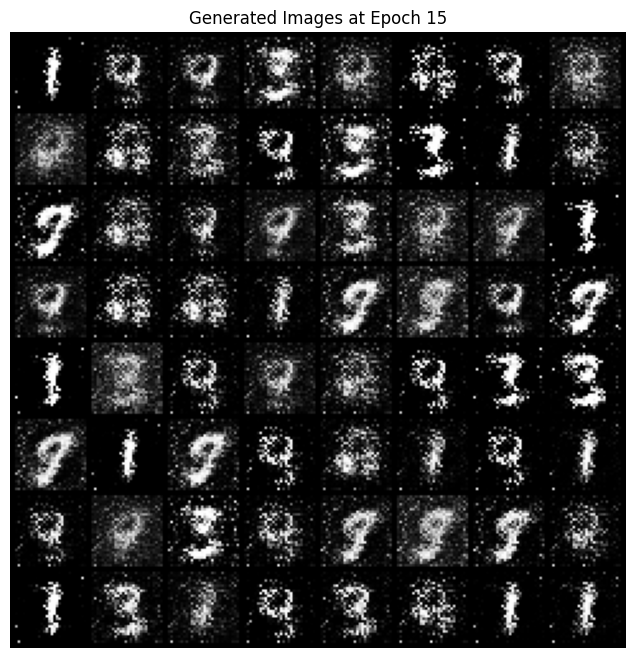

Epoch [16/50], Step [0/938], D Loss: 0.6261, G Loss: 2.9542
Epoch [16/50], Step [200/938], D Loss: 0.2660, G Loss: 4.8221
Epoch [16/50], Step [400/938], D Loss: 0.6077, G Loss: 4.1837
Epoch [16/50], Step [600/938], D Loss: 0.2906, G Loss: 3.9991
Epoch [16/50], Step [800/938], D Loss: 0.5093, G Loss: 5.2343
Saved fake images at epoch 16 to fake_images/epoch_16.png


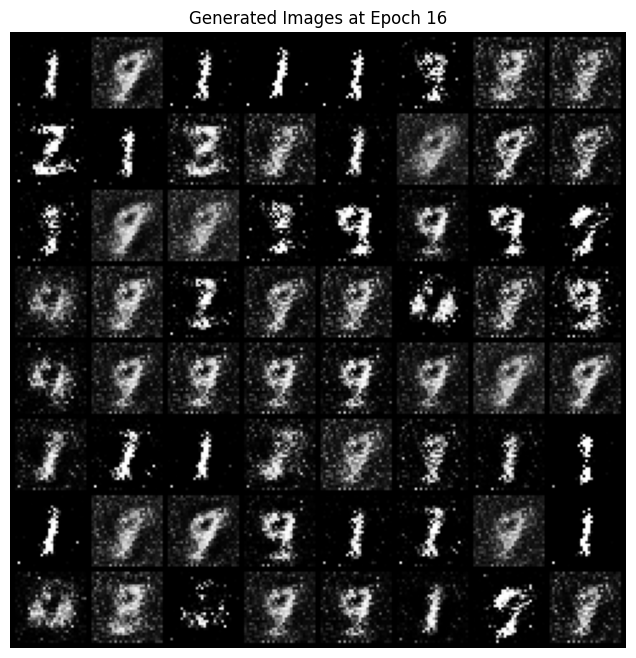

Epoch [17/50], Step [0/938], D Loss: 0.6799, G Loss: 3.3174
Epoch [17/50], Step [200/938], D Loss: 0.4315, G Loss: 4.5414
Epoch [17/50], Step [400/938], D Loss: 0.3057, G Loss: 3.5987
Epoch [17/50], Step [600/938], D Loss: 0.3630, G Loss: 5.9663
Epoch [17/50], Step [800/938], D Loss: 0.4456, G Loss: 3.4578
Saved fake images at epoch 17 to fake_images/epoch_17.png


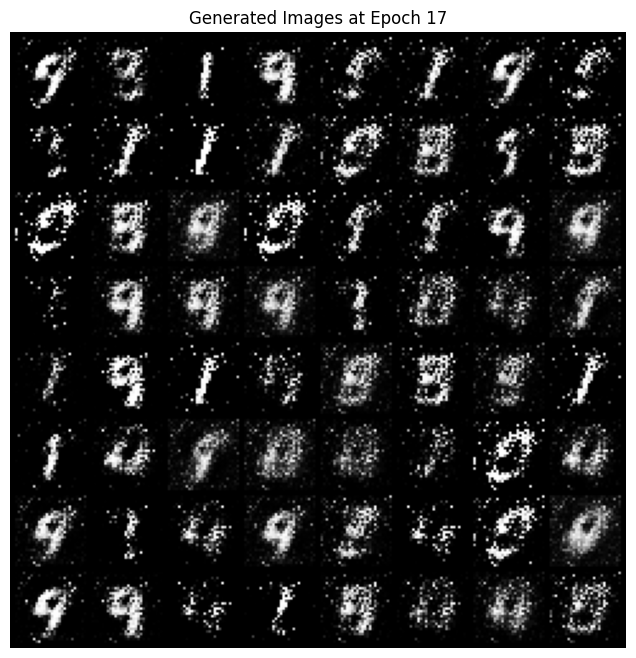

Epoch [18/50], Step [0/938], D Loss: 0.2083, G Loss: 4.4143
Epoch [18/50], Step [200/938], D Loss: 0.3111, G Loss: 5.0158
Epoch [18/50], Step [400/938], D Loss: 0.4038, G Loss: 5.8337
Epoch [18/50], Step [600/938], D Loss: 0.2683, G Loss: 4.3330
Epoch [18/50], Step [800/938], D Loss: 0.5125, G Loss: 5.2186
Saved fake images at epoch 18 to fake_images/epoch_18.png


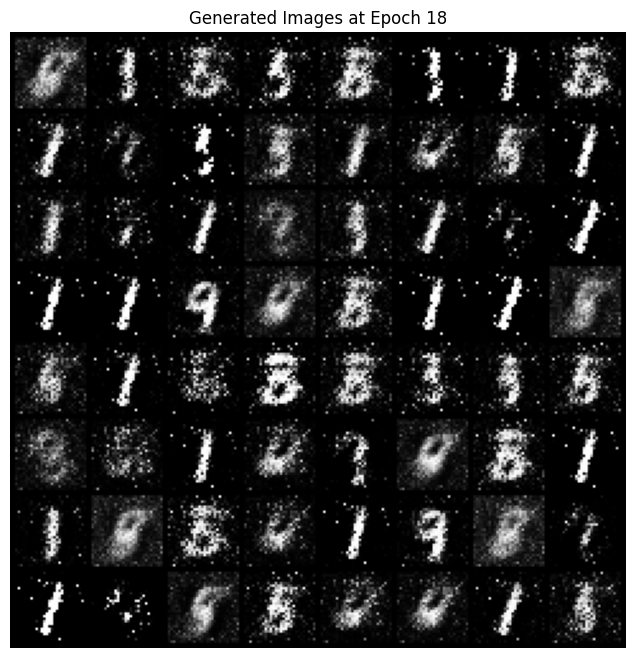

Epoch [19/50], Step [0/938], D Loss: 0.4284, G Loss: 2.9699
Epoch [19/50], Step [200/938], D Loss: 0.3897, G Loss: 3.4352
Epoch [19/50], Step [400/938], D Loss: 0.2660, G Loss: 4.1979
Epoch [19/50], Step [600/938], D Loss: 0.3652, G Loss: 3.2301
Epoch [19/50], Step [800/938], D Loss: 0.2710, G Loss: 4.5364
Saved fake images at epoch 19 to fake_images/epoch_19.png


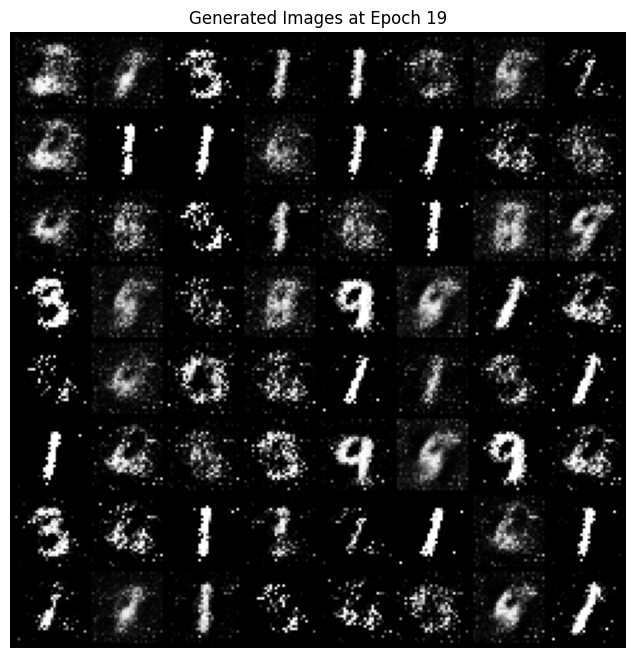

Epoch [20/50], Step [0/938], D Loss: 0.2236, G Loss: 5.6611
Epoch [20/50], Step [200/938], D Loss: 0.3622, G Loss: 4.7947
Epoch [20/50], Step [400/938], D Loss: 0.2024, G Loss: 5.6058
Epoch [20/50], Step [600/938], D Loss: 0.4821, G Loss: 3.4045
Epoch [20/50], Step [800/938], D Loss: 0.4464, G Loss: 5.2500
Saved fake images at epoch 20 to fake_images/epoch_20.png


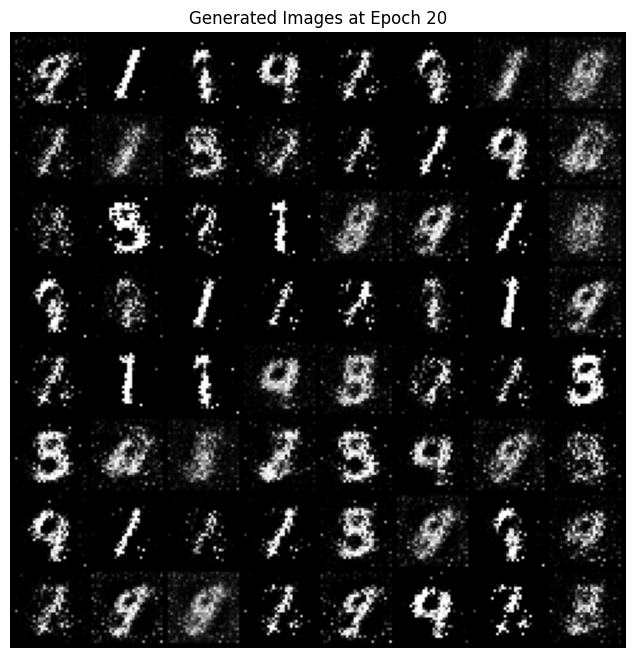

Epoch [21/50], Step [0/938], D Loss: 0.3830, G Loss: 2.5902
Epoch [21/50], Step [200/938], D Loss: 0.4178, G Loss: 3.1193
Epoch [21/50], Step [400/938], D Loss: 0.3594, G Loss: 4.3036
Epoch [21/50], Step [600/938], D Loss: 0.3378, G Loss: 4.1276
Epoch [21/50], Step [800/938], D Loss: 0.5624, G Loss: 3.0652
Saved fake images at epoch 21 to fake_images/epoch_21.png


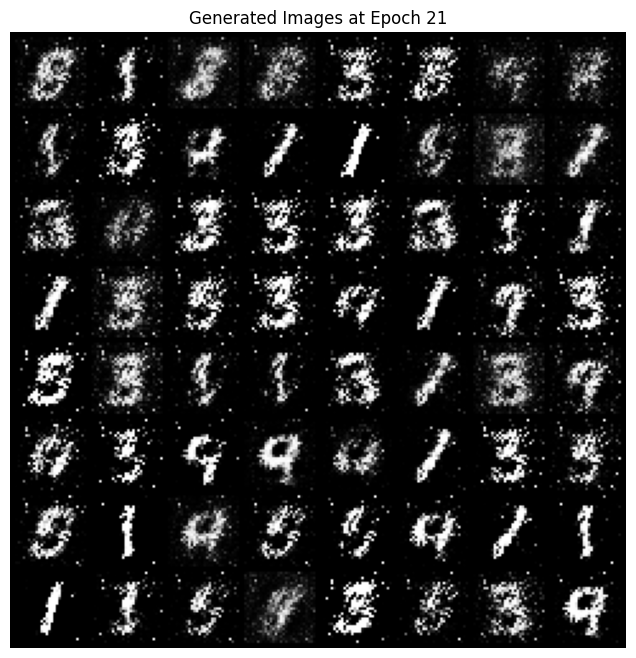

Epoch [22/50], Step [0/938], D Loss: 0.3461, G Loss: 4.0860
Epoch [22/50], Step [200/938], D Loss: 0.2982, G Loss: 2.8857
Epoch [22/50], Step [400/938], D Loss: 0.3346, G Loss: 4.5929
Epoch [22/50], Step [600/938], D Loss: 0.4033, G Loss: 4.6141
Epoch [22/50], Step [800/938], D Loss: 0.4563, G Loss: 3.1362
Saved fake images at epoch 22 to fake_images/epoch_22.png


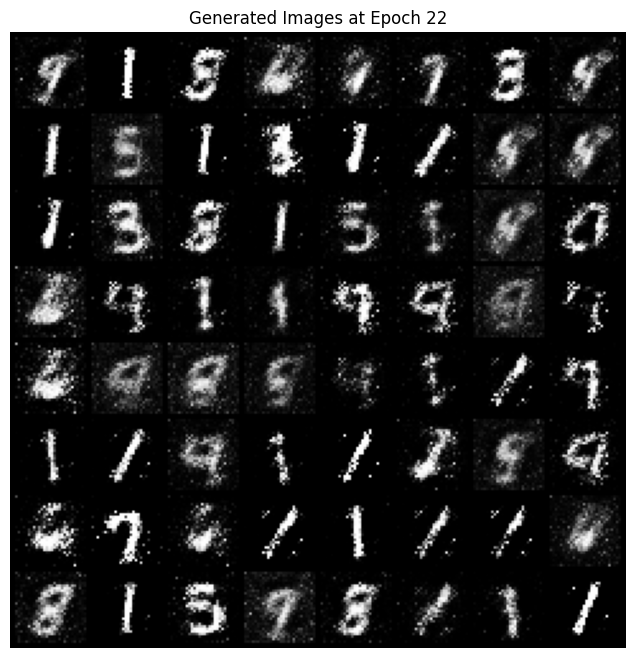

Epoch [23/50], Step [0/938], D Loss: 0.6475, G Loss: 2.7567
Epoch [23/50], Step [200/938], D Loss: 0.4993, G Loss: 4.0094
Epoch [23/50], Step [400/938], D Loss: 0.3835, G Loss: 4.4364
Epoch [23/50], Step [600/938], D Loss: 0.6547, G Loss: 2.6709
Epoch [23/50], Step [800/938], D Loss: 0.6502, G Loss: 3.4204
Saved fake images at epoch 23 to fake_images/epoch_23.png


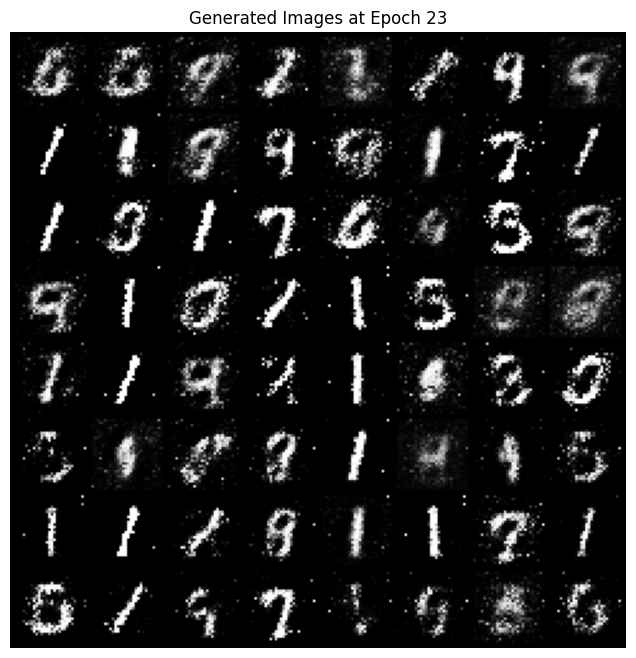

Epoch [24/50], Step [0/938], D Loss: 0.6039, G Loss: 2.3947
Epoch [24/50], Step [200/938], D Loss: 0.6992, G Loss: 3.2884
Epoch [24/50], Step [400/938], D Loss: 0.5657, G Loss: 2.7776
Epoch [24/50], Step [600/938], D Loss: 0.2954, G Loss: 3.4969
Epoch [24/50], Step [800/938], D Loss: 0.4158, G Loss: 2.8140
Saved fake images at epoch 24 to fake_images/epoch_24.png


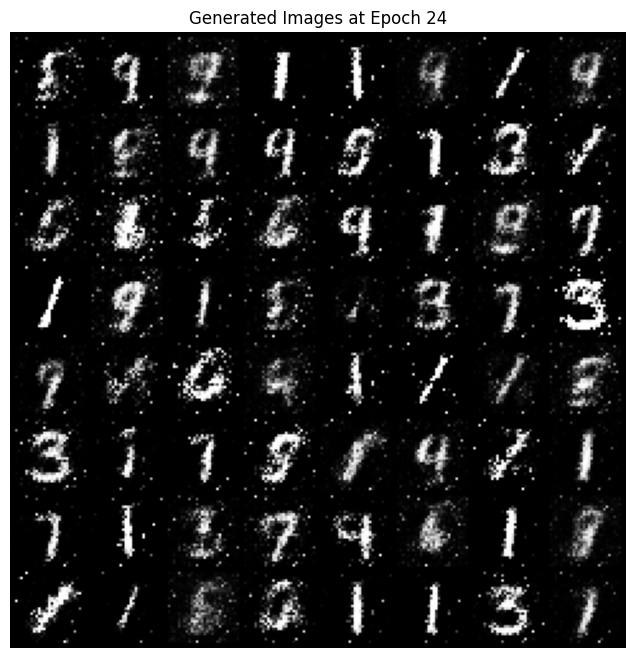

Epoch [25/50], Step [0/938], D Loss: 0.3970, G Loss: 4.0347
Epoch [25/50], Step [200/938], D Loss: 0.5061, G Loss: 3.2956
Epoch [25/50], Step [400/938], D Loss: 0.2329, G Loss: 3.6271
Epoch [25/50], Step [600/938], D Loss: 0.4771, G Loss: 3.5949
Epoch [25/50], Step [800/938], D Loss: 0.5598, G Loss: 1.9284
Saved fake images at epoch 25 to fake_images/epoch_25.png


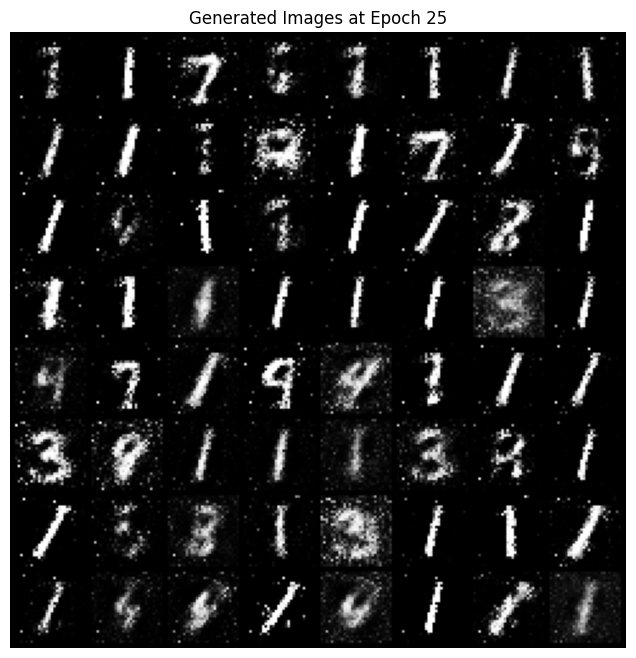

Epoch [26/50], Step [0/938], D Loss: 0.3266, G Loss: 2.8171
Epoch [26/50], Step [200/938], D Loss: 0.2999, G Loss: 4.0739
Epoch [26/50], Step [400/938], D Loss: 0.6028, G Loss: 2.3173
Epoch [26/50], Step [600/938], D Loss: 0.5631, G Loss: 2.5926
Epoch [26/50], Step [800/938], D Loss: 0.4066, G Loss: 2.7686
Saved fake images at epoch 26 to fake_images/epoch_26.png


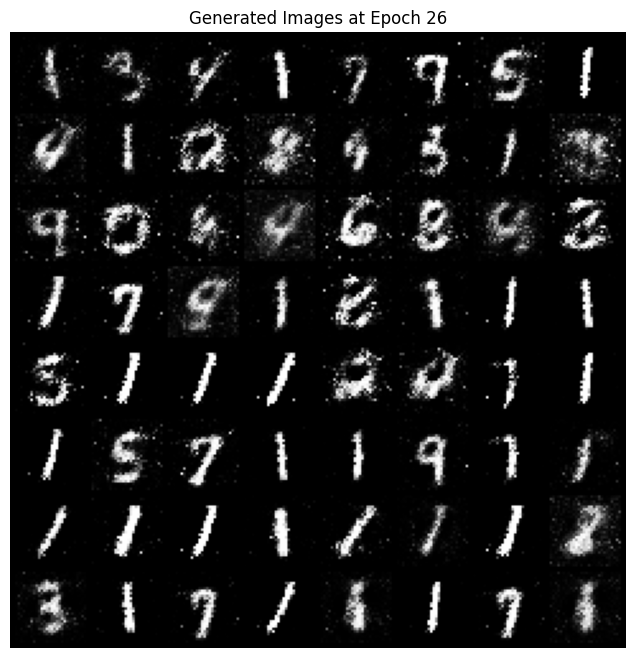

Epoch [27/50], Step [0/938], D Loss: 0.5676, G Loss: 3.7944
Epoch [27/50], Step [200/938], D Loss: 0.4691, G Loss: 3.1629
Epoch [27/50], Step [400/938], D Loss: 0.5144, G Loss: 2.4715
Epoch [27/50], Step [600/938], D Loss: 0.6942, G Loss: 2.3509
Epoch [27/50], Step [800/938], D Loss: 0.4714, G Loss: 2.7413
Saved fake images at epoch 27 to fake_images/epoch_27.png


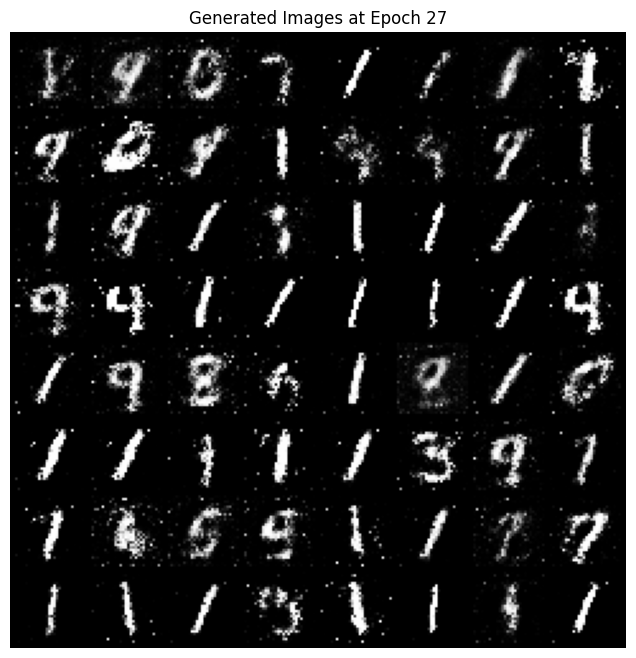

Epoch [28/50], Step [0/938], D Loss: 0.3784, G Loss: 3.1203
Epoch [28/50], Step [200/938], D Loss: 0.6350, G Loss: 2.3126
Epoch [28/50], Step [400/938], D Loss: 0.7317, G Loss: 2.7468
Epoch [28/50], Step [600/938], D Loss: 0.3526, G Loss: 3.8597
Epoch [28/50], Step [800/938], D Loss: 0.5965, G Loss: 2.7647
Saved fake images at epoch 28 to fake_images/epoch_28.png


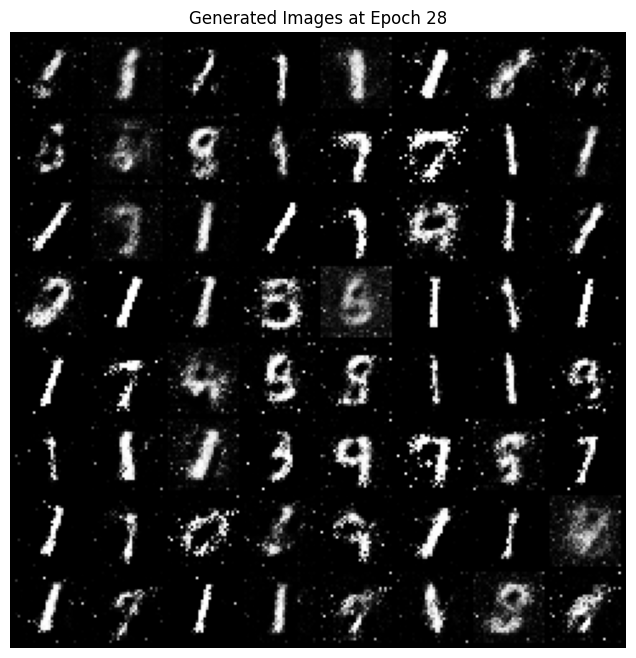

Epoch [29/50], Step [0/938], D Loss: 0.5539, G Loss: 2.0697
Epoch [29/50], Step [200/938], D Loss: 0.4967, G Loss: 2.5912
Epoch [29/50], Step [400/938], D Loss: 0.6177, G Loss: 2.0341
Epoch [29/50], Step [600/938], D Loss: 0.4752, G Loss: 2.8372
Epoch [29/50], Step [800/938], D Loss: 0.4057, G Loss: 2.6397
Saved fake images at epoch 29 to fake_images/epoch_29.png


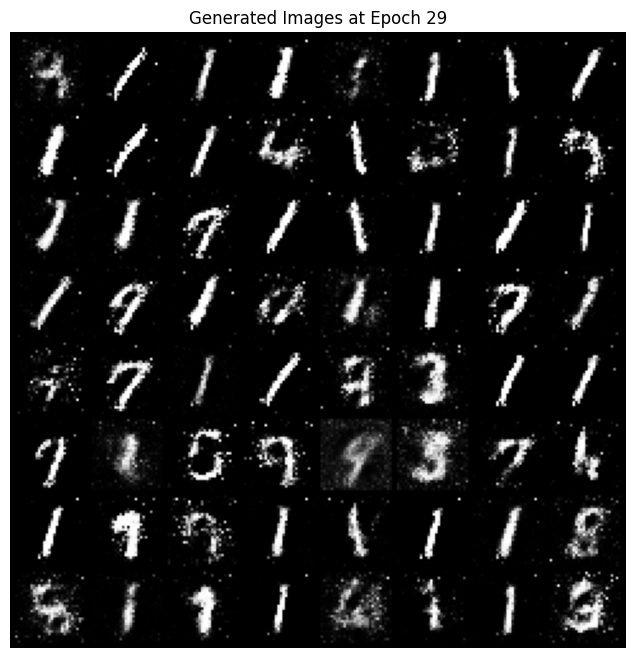

Epoch [30/50], Step [0/938], D Loss: 0.4867, G Loss: 1.6930
Epoch [30/50], Step [200/938], D Loss: 0.5209, G Loss: 2.2480
Epoch [30/50], Step [400/938], D Loss: 0.4481, G Loss: 2.4109
Epoch [30/50], Step [600/938], D Loss: 0.5962, G Loss: 3.2228
Epoch [30/50], Step [800/938], D Loss: 0.5762, G Loss: 2.5653
Saved fake images at epoch 30 to fake_images/epoch_30.png


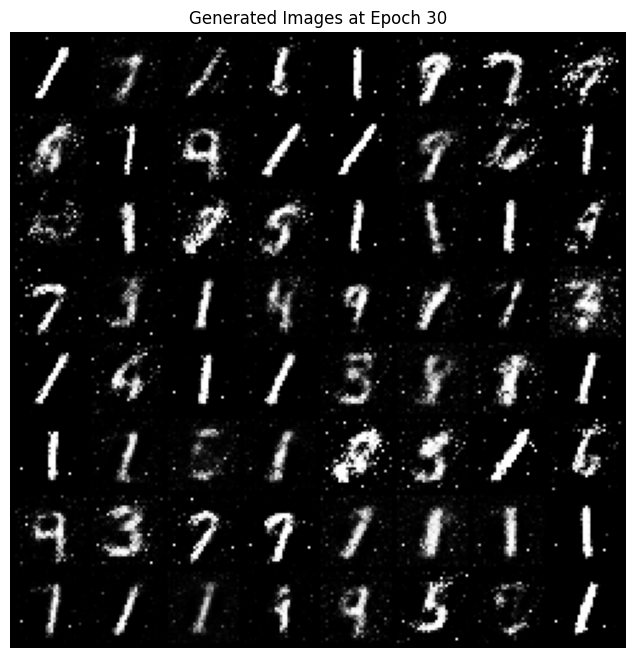

Epoch [31/50], Step [0/938], D Loss: 0.4782, G Loss: 2.8415
Epoch [31/50], Step [200/938], D Loss: 0.3999, G Loss: 2.7399
Epoch [31/50], Step [400/938], D Loss: 0.4318, G Loss: 2.6119
Epoch [31/50], Step [600/938], D Loss: 0.6234, G Loss: 2.0615
Epoch [31/50], Step [800/938], D Loss: 0.7719, G Loss: 1.7273
Saved fake images at epoch 31 to fake_images/epoch_31.png


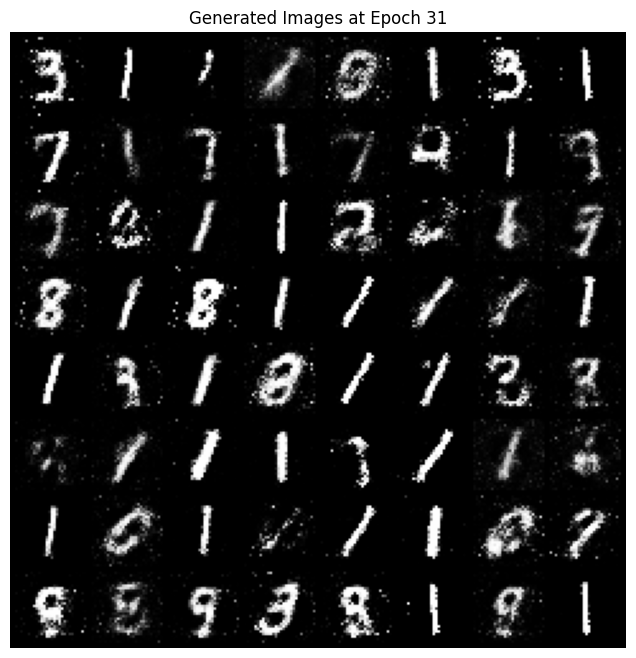

Epoch [32/50], Step [0/938], D Loss: 1.0047, G Loss: 2.1423
Epoch [32/50], Step [200/938], D Loss: 0.6147, G Loss: 2.5776
Epoch [32/50], Step [400/938], D Loss: 0.5862, G Loss: 2.3199
Epoch [32/50], Step [600/938], D Loss: 0.6418, G Loss: 2.4446
Epoch [32/50], Step [800/938], D Loss: 0.5550, G Loss: 2.6024
Saved fake images at epoch 32 to fake_images/epoch_32.png


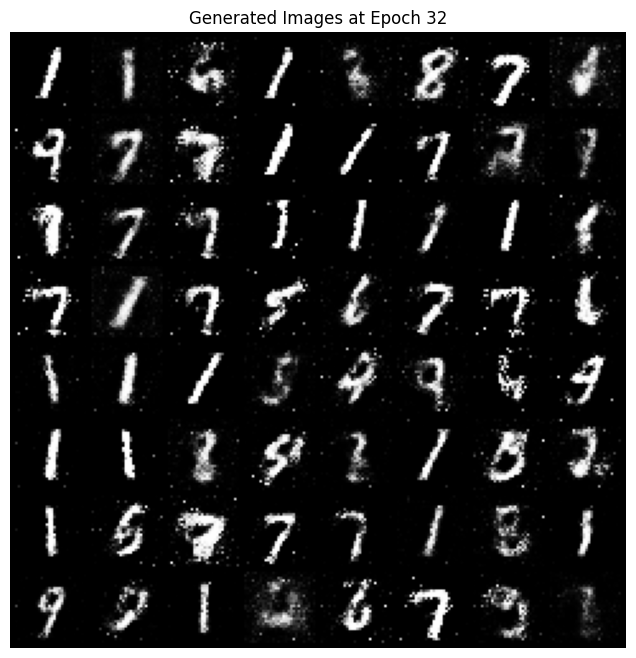

Epoch [33/50], Step [0/938], D Loss: 0.7788, G Loss: 2.3538
Epoch [33/50], Step [200/938], D Loss: 0.3943, G Loss: 3.0052
Epoch [33/50], Step [400/938], D Loss: 0.5371, G Loss: 2.4641
Epoch [33/50], Step [600/938], D Loss: 0.7217, G Loss: 1.8699
Epoch [33/50], Step [800/938], D Loss: 0.7799, G Loss: 1.8359
Saved fake images at epoch 33 to fake_images/epoch_33.png


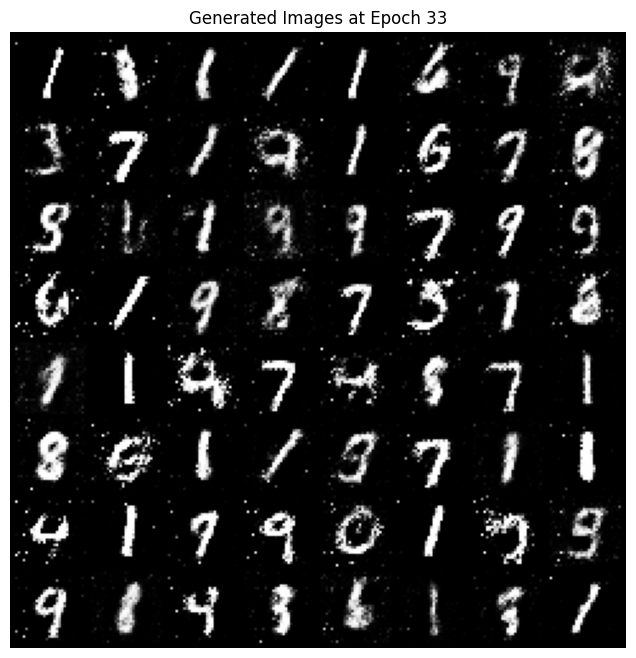

Epoch [34/50], Step [0/938], D Loss: 0.6786, G Loss: 1.3075
Epoch [34/50], Step [200/938], D Loss: 0.6613, G Loss: 1.9698
Epoch [34/50], Step [400/938], D Loss: 0.5605, G Loss: 2.5471
Epoch [34/50], Step [600/938], D Loss: 0.7196, G Loss: 1.9434
Epoch [34/50], Step [800/938], D Loss: 0.7626, G Loss: 1.4365
Saved fake images at epoch 34 to fake_images/epoch_34.png


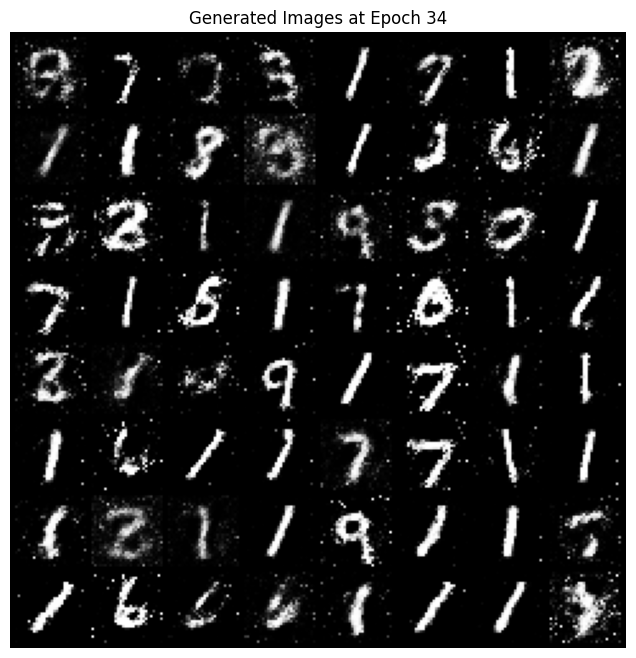

Epoch [35/50], Step [0/938], D Loss: 0.5850, G Loss: 2.3417
Epoch [35/50], Step [200/938], D Loss: 0.6489, G Loss: 2.7641
Epoch [35/50], Step [400/938], D Loss: 0.8620, G Loss: 1.6235
Epoch [35/50], Step [600/938], D Loss: 0.7895, G Loss: 1.5772
Epoch [35/50], Step [800/938], D Loss: 0.8029, G Loss: 1.9232
Saved fake images at epoch 35 to fake_images/epoch_35.png


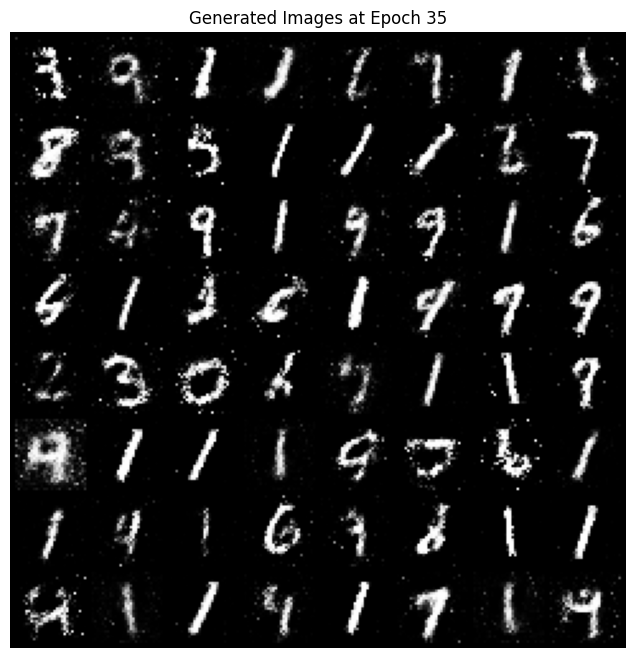

Epoch [36/50], Step [0/938], D Loss: 0.6513, G Loss: 1.9787
Epoch [36/50], Step [200/938], D Loss: 0.7621, G Loss: 1.5405
Epoch [36/50], Step [400/938], D Loss: 0.7076, G Loss: 2.0848
Epoch [36/50], Step [600/938], D Loss: 0.6379, G Loss: 1.4930
Epoch [36/50], Step [800/938], D Loss: 0.7889, G Loss: 2.3787
Saved fake images at epoch 36 to fake_images/epoch_36.png


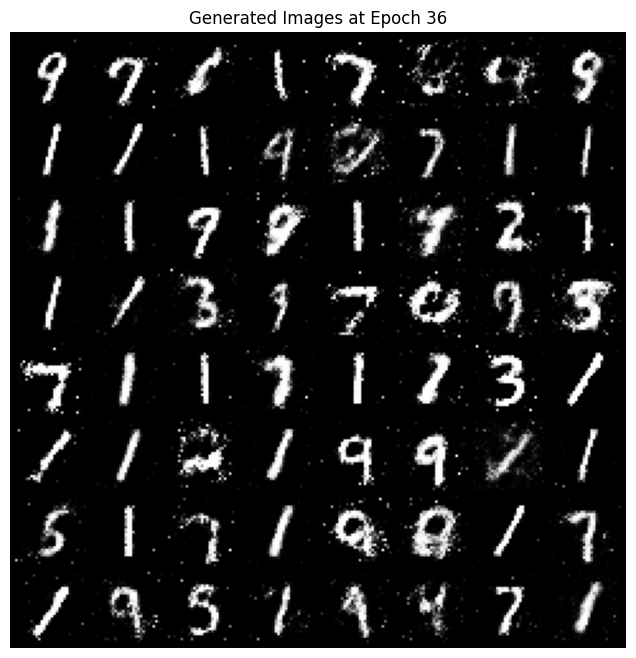

Epoch [37/50], Step [0/938], D Loss: 0.7072, G Loss: 2.6510
Epoch [37/50], Step [200/938], D Loss: 0.6280, G Loss: 2.2335
Epoch [37/50], Step [400/938], D Loss: 0.6718, G Loss: 1.7344
Epoch [37/50], Step [600/938], D Loss: 0.7337, G Loss: 2.1419
Epoch [37/50], Step [800/938], D Loss: 0.5980, G Loss: 2.5286
Saved fake images at epoch 37 to fake_images/epoch_37.png


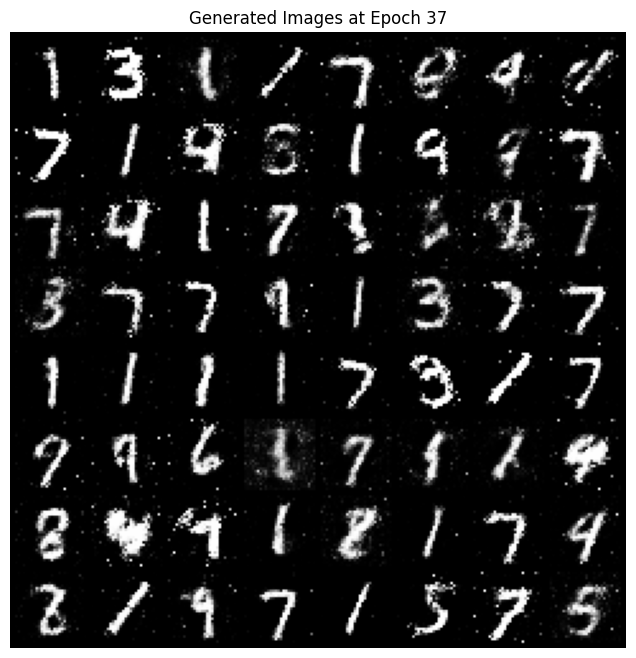

Epoch [38/50], Step [0/938], D Loss: 0.6465, G Loss: 1.5072
Epoch [38/50], Step [200/938], D Loss: 0.7750, G Loss: 1.7612
Epoch [38/50], Step [400/938], D Loss: 0.5732, G Loss: 2.7979
Epoch [38/50], Step [600/938], D Loss: 1.0176, G Loss: 1.8597
Epoch [38/50], Step [800/938], D Loss: 0.8004, G Loss: 1.2556
Saved fake images at epoch 38 to fake_images/epoch_38.png


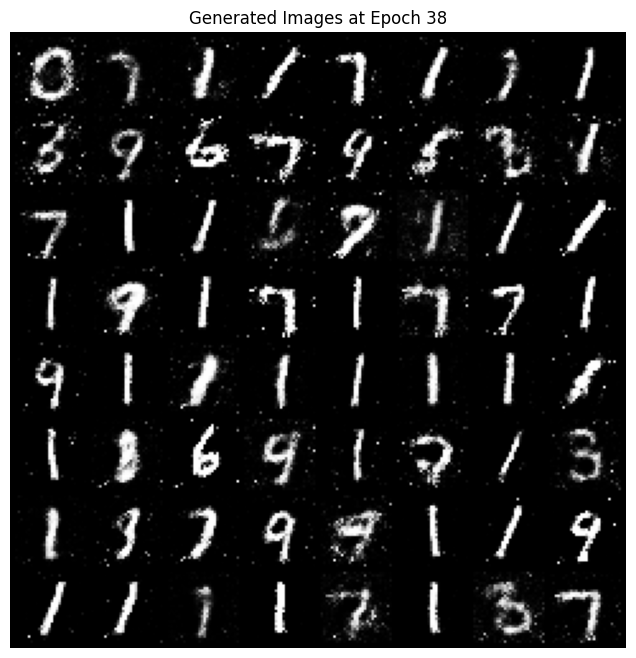

Epoch [39/50], Step [0/938], D Loss: 0.6595, G Loss: 1.8056
Epoch [39/50], Step [200/938], D Loss: 0.8425, G Loss: 2.5483
Epoch [39/50], Step [400/938], D Loss: 0.7163, G Loss: 2.3442
Epoch [39/50], Step [600/938], D Loss: 0.7786, G Loss: 2.0187
Epoch [39/50], Step [800/938], D Loss: 1.0904, G Loss: 1.9680
Saved fake images at epoch 39 to fake_images/epoch_39.png


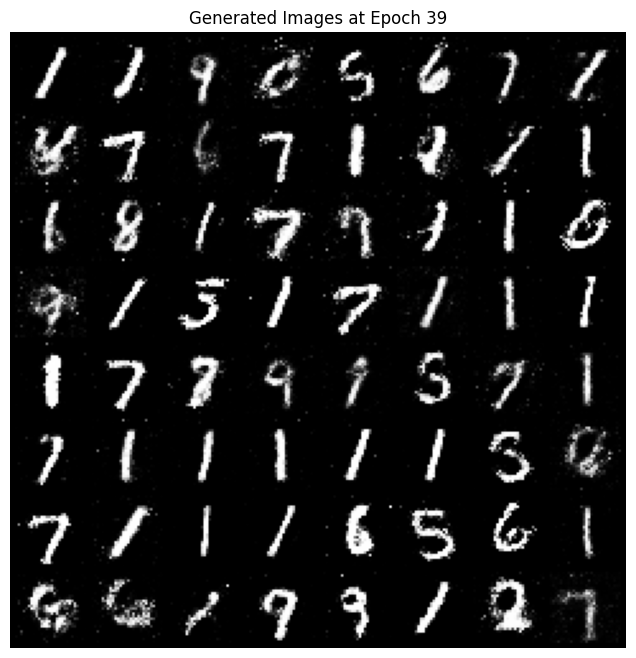

Epoch [40/50], Step [0/938], D Loss: 0.8603, G Loss: 2.2959
Epoch [40/50], Step [200/938], D Loss: 0.7183, G Loss: 1.7624
Epoch [40/50], Step [400/938], D Loss: 0.8653, G Loss: 1.9638
Epoch [40/50], Step [600/938], D Loss: 0.7803, G Loss: 1.9442
Epoch [40/50], Step [800/938], D Loss: 0.7102, G Loss: 1.7743
Saved fake images at epoch 40 to fake_images/epoch_40.png


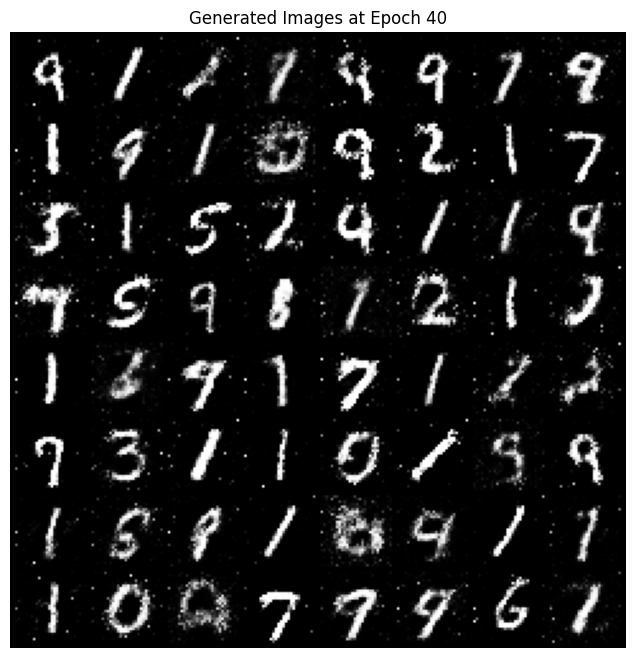

Epoch [41/50], Step [0/938], D Loss: 1.0383, G Loss: 1.5677
Epoch [41/50], Step [200/938], D Loss: 0.5888, G Loss: 1.9889
Epoch [41/50], Step [400/938], D Loss: 0.6525, G Loss: 1.8833
Epoch [41/50], Step [600/938], D Loss: 1.0077, G Loss: 1.6967
Epoch [41/50], Step [800/938], D Loss: 0.6549, G Loss: 2.0540
Saved fake images at epoch 41 to fake_images/epoch_41.png


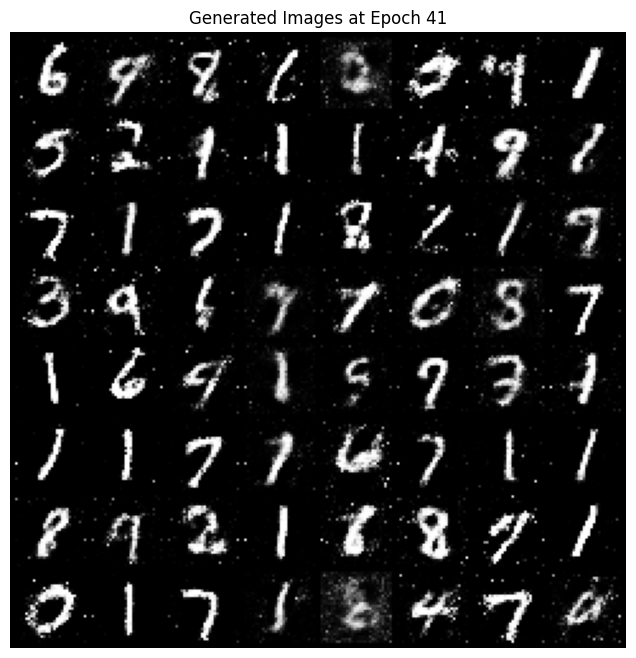

Epoch [42/50], Step [0/938], D Loss: 0.6214, G Loss: 1.7398
Epoch [42/50], Step [200/938], D Loss: 0.8193, G Loss: 2.0787
Epoch [42/50], Step [400/938], D Loss: 0.5750, G Loss: 2.5751
Epoch [42/50], Step [600/938], D Loss: 0.7560, G Loss: 1.5255
Epoch [42/50], Step [800/938], D Loss: 0.7750, G Loss: 1.8742
Saved fake images at epoch 42 to fake_images/epoch_42.png


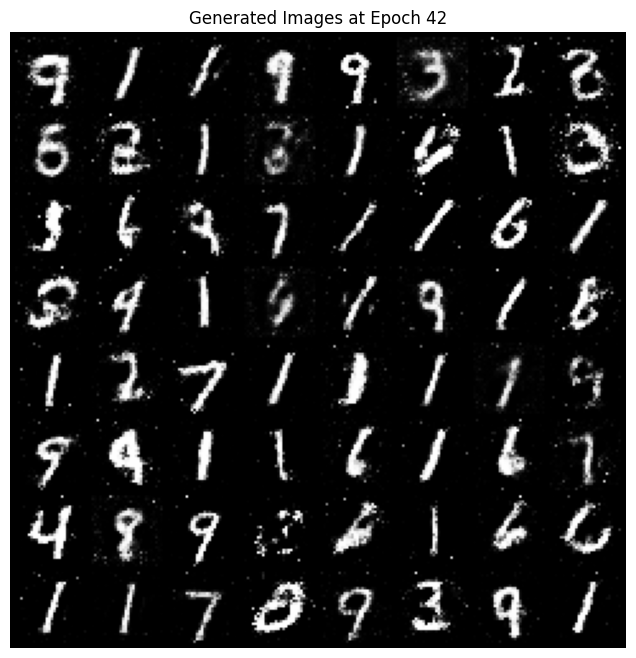

Epoch [43/50], Step [0/938], D Loss: 0.7231, G Loss: 1.5728
Epoch [43/50], Step [200/938], D Loss: 0.6868, G Loss: 1.7453
Epoch [43/50], Step [400/938], D Loss: 0.7563, G Loss: 1.8689
Epoch [43/50], Step [600/938], D Loss: 0.7430, G Loss: 1.6671
Epoch [43/50], Step [800/938], D Loss: 0.7132, G Loss: 1.5210
Saved fake images at epoch 43 to fake_images/epoch_43.png


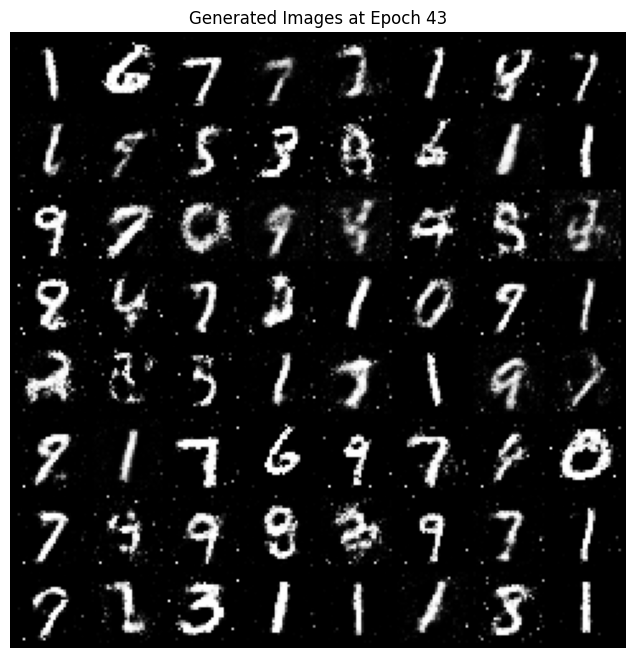

Epoch [44/50], Step [0/938], D Loss: 0.7112, G Loss: 1.5147
Epoch [44/50], Step [200/938], D Loss: 1.0602, G Loss: 1.2842
Epoch [44/50], Step [400/938], D Loss: 0.6746, G Loss: 1.5136
Epoch [44/50], Step [600/938], D Loss: 0.6582, G Loss: 2.1732
Epoch [44/50], Step [800/938], D Loss: 0.9854, G Loss: 1.5248
Saved fake images at epoch 44 to fake_images/epoch_44.png


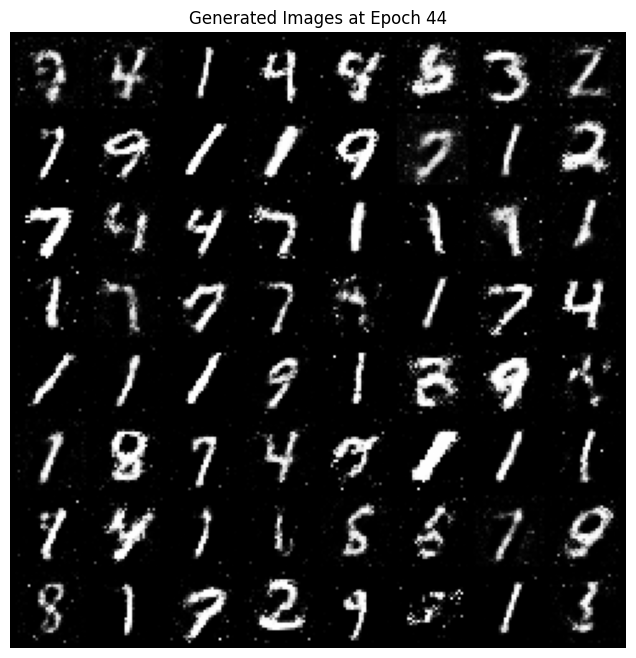

Epoch [45/50], Step [0/938], D Loss: 1.0261, G Loss: 1.7570
Epoch [45/50], Step [200/938], D Loss: 0.8578, G Loss: 1.6346
Epoch [45/50], Step [400/938], D Loss: 0.9856, G Loss: 1.3412
Epoch [45/50], Step [600/938], D Loss: 0.8476, G Loss: 2.0152
Epoch [45/50], Step [800/938], D Loss: 1.0594, G Loss: 1.5664
Saved fake images at epoch 45 to fake_images/epoch_45.png


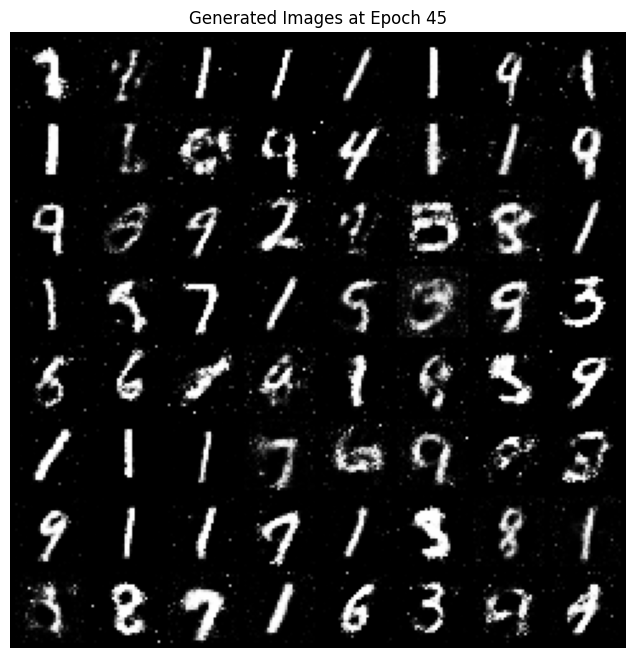

Epoch [46/50], Step [0/938], D Loss: 0.9691, G Loss: 1.7379
Epoch [46/50], Step [200/938], D Loss: 0.9175, G Loss: 1.6212
Epoch [46/50], Step [400/938], D Loss: 0.9130, G Loss: 1.5803
Epoch [46/50], Step [600/938], D Loss: 0.9215, G Loss: 1.4596
Epoch [46/50], Step [800/938], D Loss: 0.7064, G Loss: 2.0569
Saved fake images at epoch 46 to fake_images/epoch_46.png


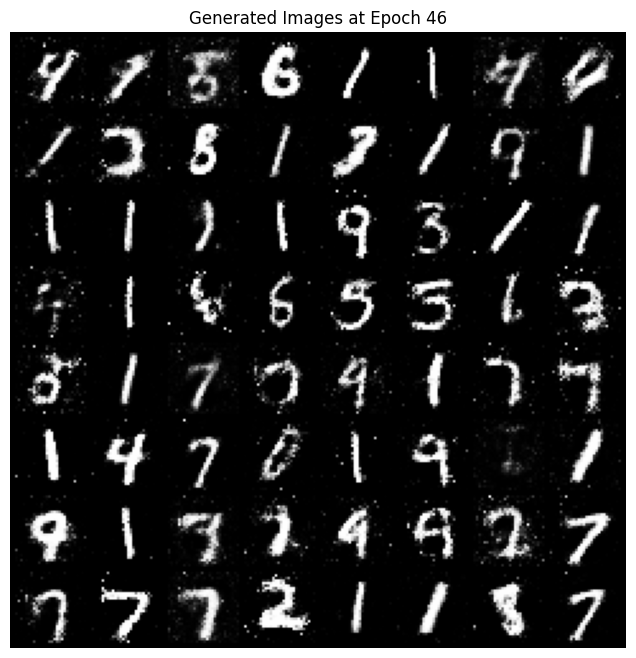

Epoch [47/50], Step [0/938], D Loss: 0.9180, G Loss: 1.5804
Epoch [47/50], Step [200/938], D Loss: 0.7645, G Loss: 1.6001
Epoch [47/50], Step [400/938], D Loss: 0.6749, G Loss: 2.1599
Epoch [47/50], Step [600/938], D Loss: 1.0593, G Loss: 1.5701
Epoch [47/50], Step [800/938], D Loss: 0.6988, G Loss: 2.0052
Saved fake images at epoch 47 to fake_images/epoch_47.png


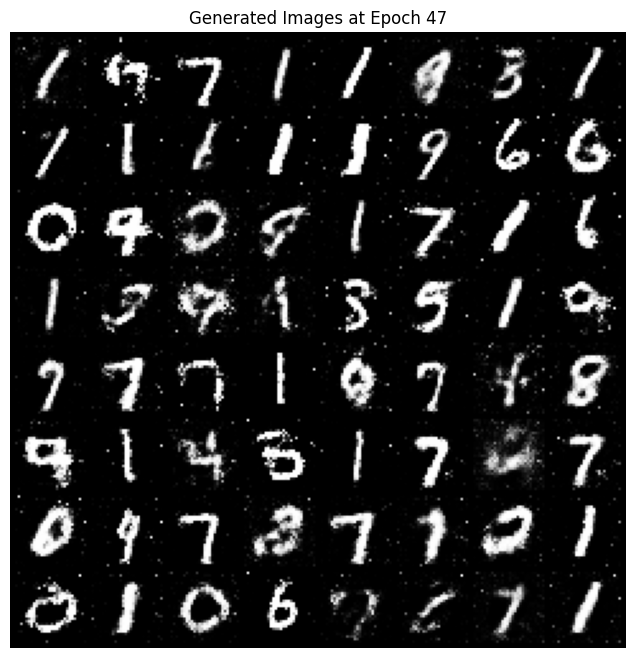

Epoch [48/50], Step [0/938], D Loss: 0.8572, G Loss: 2.0431
Epoch [48/50], Step [200/938], D Loss: 0.7759, G Loss: 1.5642
Epoch [48/50], Step [400/938], D Loss: 0.8103, G Loss: 1.4672
Epoch [48/50], Step [600/938], D Loss: 0.9884, G Loss: 1.8720
Epoch [48/50], Step [800/938], D Loss: 0.9174, G Loss: 1.8122
Saved fake images at epoch 48 to fake_images/epoch_48.png


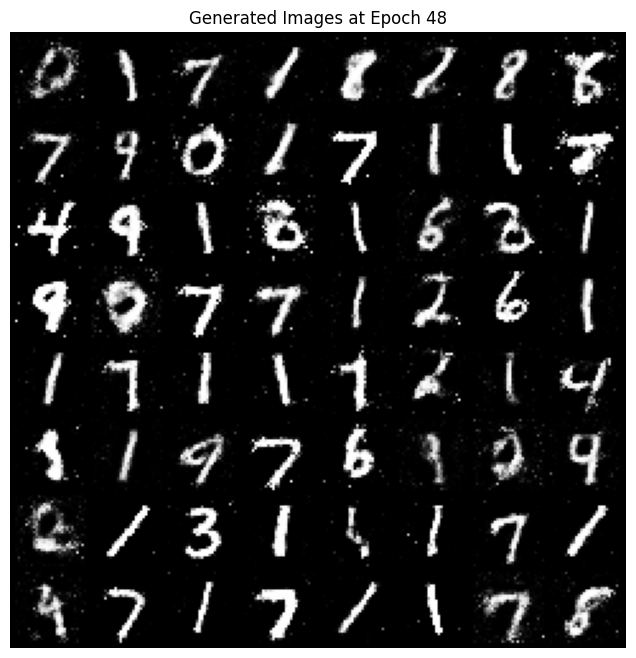

Epoch [49/50], Step [0/938], D Loss: 0.8596, G Loss: 1.5132
Epoch [49/50], Step [200/938], D Loss: 0.7086, G Loss: 1.7396
Epoch [49/50], Step [400/938], D Loss: 0.9433, G Loss: 1.5261
Epoch [49/50], Step [600/938], D Loss: 0.8079, G Loss: 2.0730
Epoch [49/50], Step [800/938], D Loss: 0.9101, G Loss: 1.7858
Saved fake images at epoch 49 to fake_images/epoch_49.png


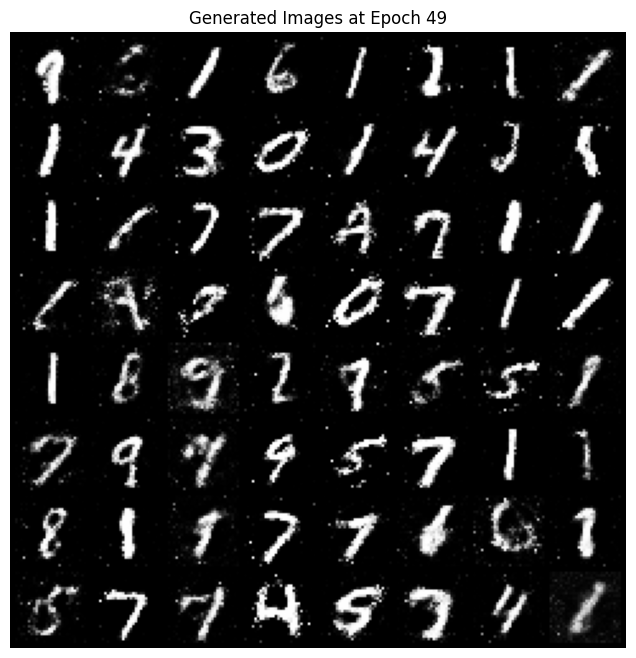

In [22]:
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(dataloader):
        real_images = real_images.view(-1, image_size).to(device)
        batch_size = real_images.size(0)

        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)

        optimizer_D.zero_grad()
        outputs = discriminator(real_images)
        d_loss_real = loss_function(outputs, real_labels)
        noise = generate_noise(batch_size, latent_dim)
        fake_images = generator(noise)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = loss_function(outputs, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()
        optimizer_G.zero_grad()
        fake_images = generator(noise)
        outputs = discriminator(fake_images)
        g_loss = loss_function(outputs, real_labels)
        g_loss.backward()
        optimizer_G.step()

        if i % 200 == 0:
            print(f"Epoch [{epoch}/{num_epochs}], Step [{i}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

    with torch.no_grad():
        noise = generate_noise(64, latent_dim)
        fake_images = generator(noise)
        save_fake_images(epoch, fake_images)